In [62]:
# Importing libraries
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from pathlib import Path
from sklearn.preprocessing import LabelEncoder
pd.set_option("display.max_columns", None)

In [63]:
# Creating data path 
data_path = Path("../data/WA_Fn-UseC_-Telco-Customer-Churn.csv")

# Reading path
df = pd.read_csv(data_path)

In [64]:
# Showing Data Frame
df

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.6,Yes


In [65]:
from sklearn.model_selection import train_test_split

df_train, df_holdout = train_test_split(df, random_state=42, test_size= 700, stratify=df['Churn'])

In [66]:
print(df_train.shape)
print(df_holdout.shape)


(6343, 21)
(700, 21)


In [67]:
df_train.to_csv("../data/train.csv", index=False)
df_holdout.to_csv("../data/test_holdout.csv", index=False)
print("all save")

all save


In [68]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6343 entries, 3912 to 5639
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        6343 non-null   object 
 1   gender            6343 non-null   object 
 2   SeniorCitizen     6343 non-null   int64  
 3   Partner           6343 non-null   object 
 4   Dependents        6343 non-null   object 
 5   tenure            6343 non-null   int64  
 6   PhoneService      6343 non-null   object 
 7   MultipleLines     6343 non-null   object 
 8   InternetService   6343 non-null   object 
 9   OnlineSecurity    6343 non-null   object 
 10  OnlineBackup      6343 non-null   object 
 11  DeviceProtection  6343 non-null   object 
 12  TechSupport       6343 non-null   object 
 13  StreamingTV       6343 non-null   object 
 14  StreamingMovies   6343 non-null   object 
 15  Contract          6343 non-null   object 
 16  PaperlessBilling  6343 non-null   object 
 1

In [69]:
# Data Frame Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [70]:
# Changing Column to numeric
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors="coerce")
df = df.dropna(subset=["TotalCharges"])

In [71]:
# Dropping ID column
df = df.drop(columns="customerID")

In [72]:
df

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.50,No
7039,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.90,No
7040,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.60,Yes


In [79]:
df['Churn_num'] = df['Churn'].map({'No': 0, "Yes": 1})
df.groupby(['Contract'])['Churn_num'].mean()

Contract
Month-to-month    0.427097
One year          0.112772
Two year          0.028487
Name: Churn_num, dtype: float64

In [61]:
# Changing categorical columns to numeric
df_encoded = pd.get_dummies(df, drop_first=True)

In [13]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7032 entries, 0 to 7042
Data columns (total 31 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   SeniorCitizen                          7032 non-null   int64  
 1   tenure                                 7032 non-null   int64  
 2   MonthlyCharges                         7032 non-null   float64
 3   TotalCharges                           7032 non-null   float64
 4   gender_Male                            7032 non-null   bool   
 5   Partner_Yes                            7032 non-null   bool   
 6   Dependents_Yes                         7032 non-null   bool   
 7   PhoneService_Yes                       7032 non-null   bool   
 8   MultipleLines_No phone service         7032 non-null   bool   
 9   MultipleLines_Yes                      7032 non-null   bool   
 10  InternetService_Fiber optic            7032 non-null   bool   
 11  InternetS

In [49]:
df_encoded.groupby(['Contract'])['Churn'].mean()


KeyError: 'Contract'

In [14]:
df_encoded

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges,gender_Male,Partner_Yes,Dependents_Yes,PhoneService_Yes,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaperlessBilling_Yes,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,Churn_Yes
0,0,1,29.85,29.85,False,True,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False
1,0,34,56.95,1889.50,True,False,False,True,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,True,False
2,0,2,53.85,108.15,True,False,False,True,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,True,True
3,0,45,42.30,1840.75,True,False,False,False,True,False,False,False,False,True,False,False,False,True,False,True,False,False,False,False,True,False,False,False,False,False,False
4,0,2,70.70,151.65,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,0,24,84.80,1990.50,True,True,True,True,False,True,False,False,False,True,False,False,False,True,False,True,False,True,False,True,True,False,True,False,False,True,False
7039,0,72,103.20,7362.90,False,True,True,True,False,True,True,False,False,False,False,True,False,True,False,False,False,True,False,True,True,False,True,True,False,False,False
7040,0,11,29.60,346.45,False,True,True,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False
7041,1,4,74.40,306.60,True,True,False,True,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,True


In [15]:
df_encoded['Churn_Yes'].value_counts()

Churn_Yes
False    5163
True     1869
Name: count, dtype: int64

<Axes: xlabel='Churn_Yes', ylabel='count'>

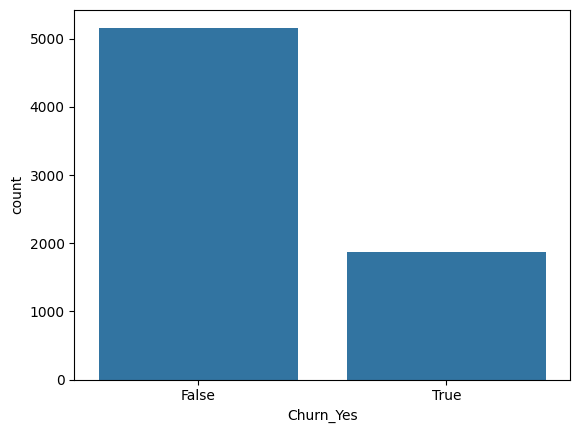

In [16]:

sns.barplot(df_encoded['Churn_Yes'].value_counts())

In [17]:
X = df_encoded.drop(columns="Churn_Yes")
y = df_encoded['Churn_Yes']


In [22]:
X

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges,gender_Male,Partner_Yes,Dependents_Yes,PhoneService_Yes,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaperlessBilling_Yes,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,1,29.85,29.85,False,True,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,True,False
1,0,34,56.95,1889.50,True,False,False,True,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,True
2,0,2,53.85,108.15,True,False,False,True,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,True
3,0,45,42.30,1840.75,True,False,False,False,True,False,False,False,False,True,False,False,False,True,False,True,False,False,False,False,True,False,False,False,False,False
4,0,2,70.70,151.65,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,0,24,84.80,1990.50,True,True,True,True,False,True,False,False,False,True,False,False,False,True,False,True,False,True,False,True,True,False,True,False,False,True
7039,0,72,103.20,7362.90,False,True,True,True,False,True,True,False,False,False,False,True,False,True,False,False,False,True,False,True,True,False,True,True,False,False
7040,0,11,29.60,346.45,False,True,True,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False
7041,1,4,74.40,306.60,True,True,False,True,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True


In [36]:
for idx, row in X.iterrows():
    print(row)

SeniorCitizen                                0
tenure                                       1
MonthlyCharges                           29.85
TotalCharges                             29.85
gender_Male                              False
Partner_Yes                               True
Dependents_Yes                           False
PhoneService_Yes                         False
MultipleLines_No phone service            True
MultipleLines_Yes                        False
InternetService_Fiber optic              False
InternetService_No                       False
OnlineSecurity_No internet service       False
OnlineSecurity_Yes                       False
OnlineBackup_No internet service         False
OnlineBackup_Yes                          True
DeviceProtection_No internet service     False
DeviceProtection_Yes                     False
TechSupport_No internet service          False
TechSupport_Yes                          False
StreamingTV_No internet service          False
StreamingTV_Y

In [454]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)


In [455]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(5625, 30)
(1407, 30)
(5625,)
(1407,)


In [533]:
from xgboost import XGBClassifier

model = XGBClassifier(
    objective='binary:logistic',
    n_estimators=100,
    max_depth=2,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    use_label_encoder=False,
    eval_metric='logloss',
    scale_pos_weight =2.76
)

model.fit(X_train, y_train)

c:\Users\Renan Muniz\Desktop\customer-churn-pipeline\venv\Lib\site-packages\xgboost\training.py:199: UserWarning: [22:44:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


,objective,'binary:logistic'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,0.8
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,'logloss'


In [ ]:
y_prob = model.predict_proba(X_test)[:,1]
y_pred = (y_prob >= 0.4).astype(float)

In [625]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score

print("Acurácia:", accuracy_score(y_test, y_pred))
print("AUC-ROC:", roc_auc_score(y_test, y_prob))
print("\nRelatório de Classificação:\n", classification_report(y_test, y_pred))

Acurácia: 0.6823027718550106
AUC-ROC: 0.8404263579936946

Relatório de Classificação:
               precision    recall  f1-score   support

       False       0.92      0.62      0.74      1033
        True       0.45      0.86      0.59       374

    accuracy                           0.68      1407
   macro avg       0.69      0.74      0.67      1407
weighted avg       0.80      0.68      0.70      1407



In [626]:
cm = confusion_matrix(y_test, y_pred)

<Axes: >

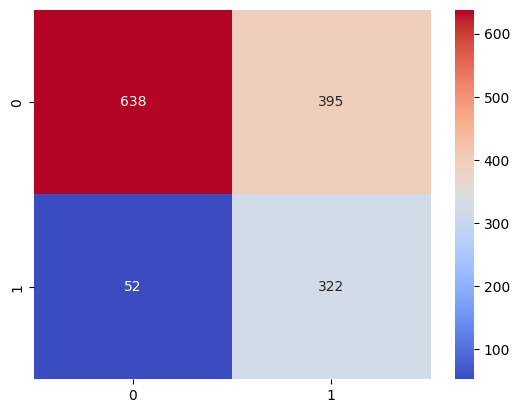

In [627]:
sns.heatmap(cm, annot=True, fmt="d", cmap="coolwarm")

In [633]:
df2 = pd.DataFrame(X.columns, columns=["Feature"])
df3 = pd.DataFrame(model.feature_importances_, columns=["Importance"])
df4 = pd.concat([df2, df3], axis=1)
df4.sort_values(by="Importance", ascending=False)

,Feature,Importance
25,Contract_Two year,0.219237
10,InternetService_Fiber optic,0.144348
28,PaymentMethod_Electronic check,0.138905
24,Contract_One year,0.128557
12,OnlineSecurity_No internet service,0.076994
11,InternetService_No,0.053454
1,tenure,0.048869
13,OnlineSecurity_Yes,0.029240
21,StreamingTV_Yes,0.020822
23,StreamingMovies_Yes,0.019004


In [5]:
path = Path("../data/test_holdout.csv")

df = pd.read_csv(path)


In [8]:
line = df.iloc[10]
json_exemplo = line.to_dict()

In [9]:
json_exemplo

{'gender': 'Male',
 'SeniorCitizen': 0,
 'Partner': 'No',
 'Dependents': 'No',
 'tenure': 1,
 'PhoneService': 'Yes',
 'MultipleLines': 'No',
 'InternetService': 'No',
 'OnlineSecurity': 'No internet service',
 'OnlineBackup': 'No internet service',
 'DeviceProtection': 'No internet service',
 'TechSupport': 'No internet service',
 'StreamingTV': 'No internet service',
 'StreamingMovies': 'No internet service',
 'Contract': 'Month-to-month',
 'PaperlessBilling': 'Yes',
 'PaymentMethod': 'Mailed check',
 'MonthlyCharges': 18.85,
 'TotalCharges': 18.85,
 'Churn': 'Yes'}